# MDS on dmap distance matrix

In [1]:
import numpy as np
from pathlib import Path
from graspy.plot import pairplot, heatmap

import sys; sys.path.append('../')
from src.tools import get_files, get_latents, load_fsaverage5
from src.plotting import visualize_embeddings, make_cbar
from src.tools import align, iterate_align
from src.tools.preprocess import procrustes

from sklearn.metrics import pairwise_distances
from sklearn.manifold import MDS

import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
sns.set(color_codes=True, style='white', context='talk', font_scale=1)
PALETTE = sns.color_palette("Set1")

%load_ext autoreload
%autoreload 2

In [2]:
def load_data(source_dir, data, exclude_ids=['073']):
    source_dir = Path(source_dir)
    if data == 'antoine':
        flag = "_emb"
        SOURCE = 'dmap'
        ftype = 'npy'
    elif data == 'gcca':
        flag = "_gcca"
        SOURCE = 'gcca'
        ftype = 'h5'
    elif data == 'svd':
        flag = '_svd'
        SOURCE = 'gcca'
        ftype = 'h5'
    elif data == 'dmap':
        flag = '_dmap'
        SOURCE = 'gcca'
        ftype = 'h5'
    elif data == 'mase_dmap':
        flag = '_mase_dmap'
        SOURCE = 'gcca'
        ftype = 'h5'
    elif data == 'mase':
        flag = '_mase'
        SOURCE = 'gcca'
        ftype = 'h5'
    elif data == 'joint':
        flag = '_joint'
        SOURCE = 'gcca'
        ftype = 'h5'
    return get_latents(
        source_dir, flag=flag, ids=True, ftype=ftype, source=SOURCE, subjects_exclude=exclude_ids, as_groups=False
    )

## Antoine data

In [31]:
source_dir = '/mnt/ssd3/ronan/data/dmap_antoinne_09-04'
data = 'antoine'
Xs, labels, subjs = load_data(source_dir, data)
print(np.linalg.norm(Xs[1], axis=0))

sort_idx = np.argsort(subjs)
Xs = Xs[sort_idx]
labels = labels[sort_idx]
subjs = subjs[sort_idx]
labels_st = [l[0] + ' ' + l[1] for l in labels]
labels_subj_st = [f'{subj}, {l}' for subj,l in zip(subjs, labels_st)]

[252.59346  246.74161  168.04521  123.80227   92.611305]


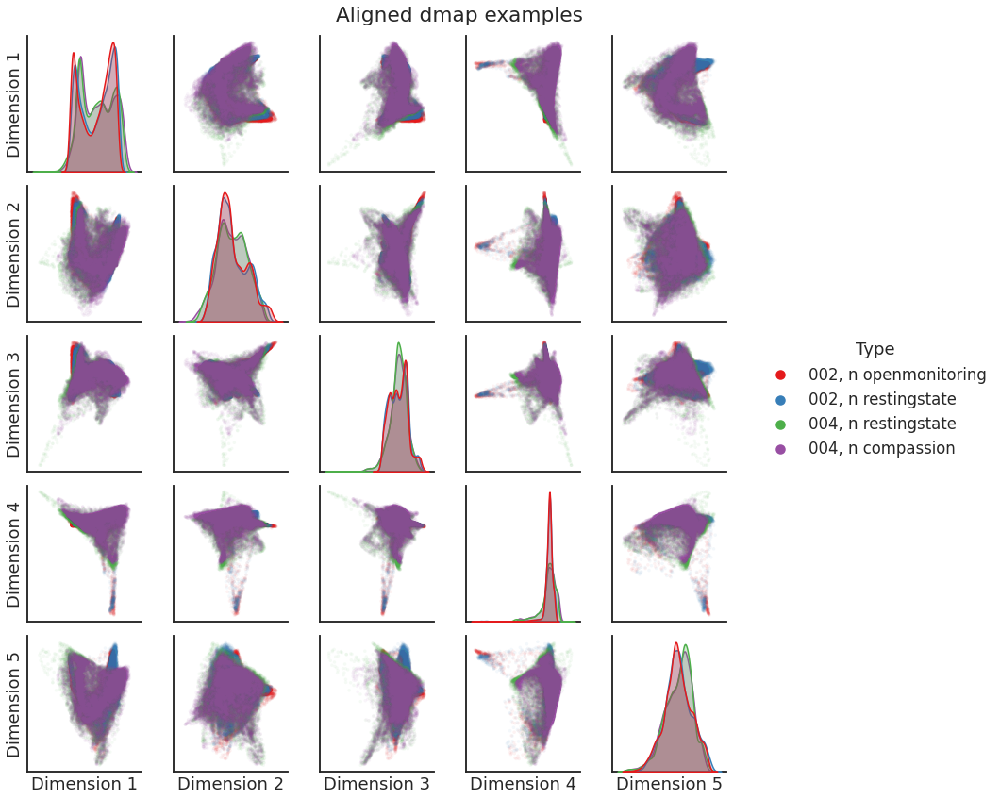

In [32]:
embeddings = Xs
embeddings /= np.linalg.norm(embeddings, axis=1, keepdims=True)

embeddings, _, _ = iterate_align(
    embeddings, labels_st, subjs, thresh=0, max_iter=5, mean_align=True)

# max_iter = 5
# embeddings = align(embeddings[1:], embeddings[0], firstpass=True)

# for i in range(max_iter):
#     mean = np.mean(embeddings, axis=0).squeeze()
#     embeddings = align(
#         embeddings, np.asarray(mean),
#         firstpass=False, debug=True)
# embeddings = np.asarray(embeddings)
pairplot(
    np.vstack(embeddings[1:5]),
    labels=np.hstack([[l]*18715 for l in labels_subj_st[1:5]]),
    alpha=0.05,
    title=f'Aligned dmap examples'
)

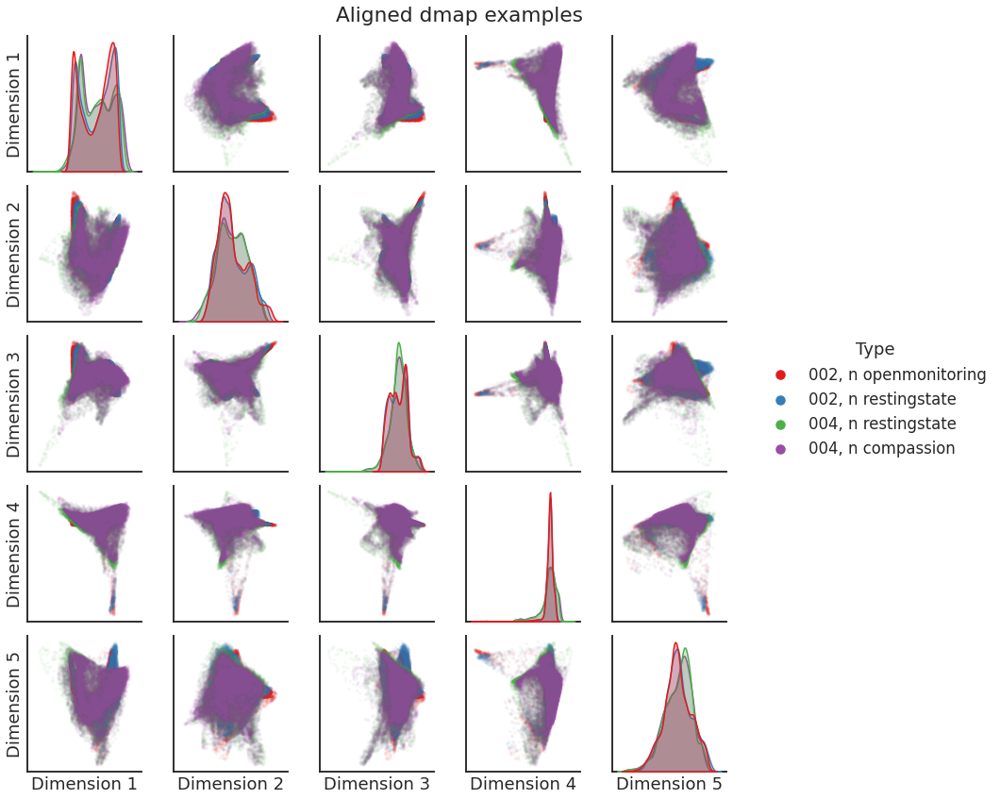

In [33]:
embeddings = Xs
embeddings /= np.linalg.norm(embeddings, axis=1, keepdims=True)

embeddings, _, _ = iterate_align(
    embeddings, labels_st, subjs, thresh=0, max_iter=5, mean_align=False)

# max_iter = 5
# embeddings = align(embeddings[1:], embeddings[0], firstpass=True)

# for i in range(max_iter):
#     mean = np.mean(embeddings, axis=0).squeeze()
#     embeddings = align(
#         embeddings, np.asarray(mean),
#         firstpass=False, debug=True)
# embeddings = np.asarray(embeddings)
pairplot(
    np.vstack(embeddings[1:5]),
    labels=np.hstack([[l]*18715 for l in labels_subj_st[1:5]]),
    alpha=0.05,
    title=f'Aligned dmap examples'
)

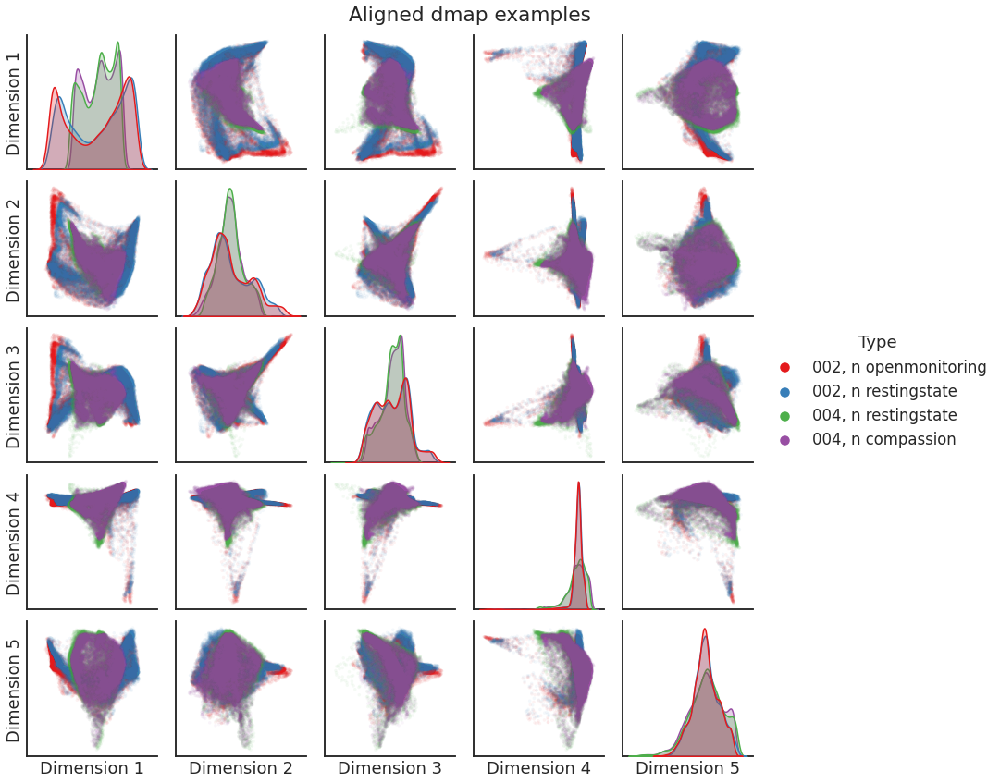

In [14]:
embeddings = Xs
max_iter = 5
embeddings = align(embeddings[1:], embeddings[0], firstpass=True)

for i in range(max_iter):
    mean = np.mean(embeddings, axis=0).squeeze()
    embeddings = align(
        embeddings, np.asarray(mean),
        firstpass=False, debug=True)
embeddings = np.asarray(embeddings)
pairplot(
    np.vstack(embeddings[1:5]),
    labels=np.hstack([[l]*18715 for l in labels_subj_st[1:5]]),
    alpha=0.05,
    title=f'Aligned dmap examples'
)

<Figure size 432x288 with 0 Axes>

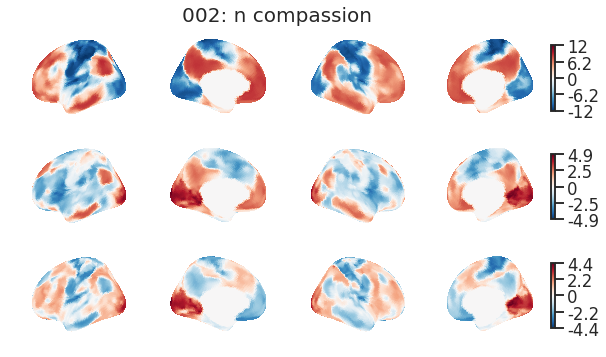

In [15]:
n_embed = 3
for X, subj, (trait, state) in zip(Xs, subjs, labels):
    title = f'{subj}: {trait} {state}'
    fig = visualize_embeddings(
        X[:, :n_embed],
        save_path=False,
        colorbar=True,
        n_embed=n_embed,
        # vmax=vmax,
        title=title,
    )
    plt.show()
    break

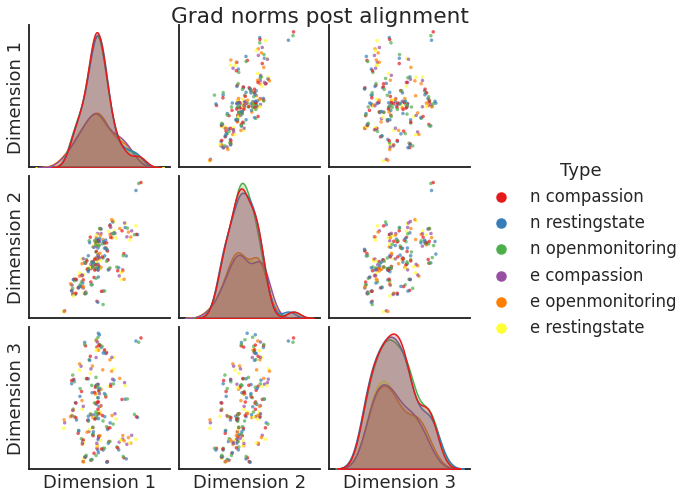

In [207]:
norms = np.linalg.norm(embeddings, axis=1)
pairplot(
    norms[:,:3],
    labels=labels_st,
    title=f'Grad norms post alignment'
)
plt.show()

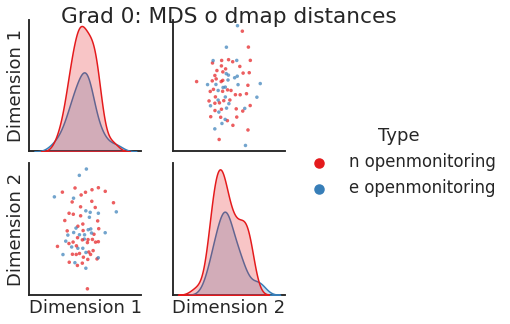

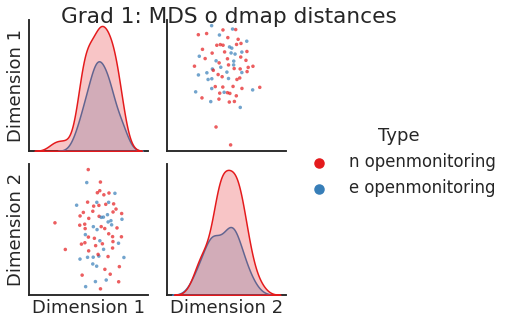

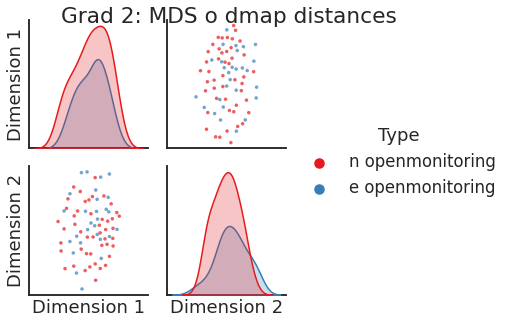

In [66]:
n_components = 2
idx = np.where(labels[:,1] == 'openmonitoring')[0]
for g in range(3):
    mat = np.vstack(embeddings[:,:,g]) / np.linalg.norm(np.vstack(embeddings[:,:,g]), axis=0, keepdims=True)
    mds_mat = MDS(n_components=n_components).fit_transform(mat[idx])

    fig = pairplot(mds_mat, labels=np.asarray(labels_st)[idx], title=f"Grad {g}: MDS o dmap distances")
    plt.show()

## Dmap replicated, 12/4 (csv)

In [6]:
source_dir = '/mnt/ssd3/ronan/data/dmap_replication-csv_aligned_12-04'
data = 'dmap'
Xs, labels, subjs = load_data(source_dir, data)
print(np.linalg.norm(Xs[1], axis=0))

sort_idx = np.argsort(subjs)
Xs = Xs[sort_idx]
labels = labels[sort_idx]
subjs = subjs[sort_idx]
labels_st = [l[0] + ' ' + l[1] for l in labels]
labels_subj_st = [f'{subj}, {l}' for subj,l in zip(subjs, labels_st)]

[0.99583193 0.99646271 1.00270874 1.01318021 0.9916763 ]


<Figure size 432x288 with 0 Axes>

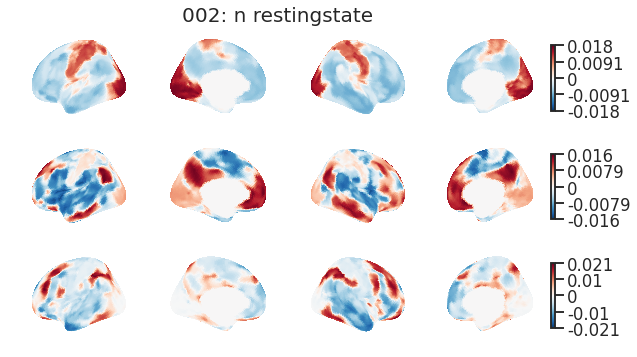

In [7]:
n_embed = 3
for X, subj, (trait, state) in zip(Xs, subjs, labels):
    title = f'{subj}: {trait} {state}'
    fig = visualize_embeddings(
        X[:, :n_embed],
        save_path=False,
        colorbar=True,
        n_embed=n_embed,
        # vmax=vmax,
        title=title,
    )
    plt.show()
    break

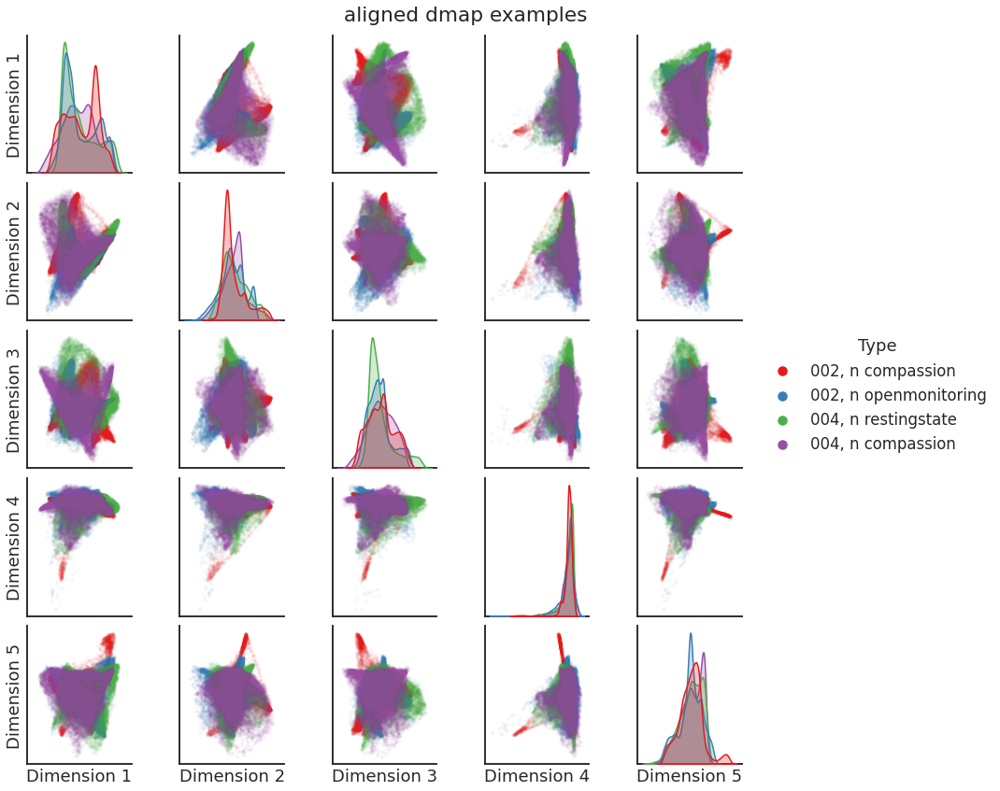

In [9]:
pairplot(
    np.vstack(Xs[1:5]),
    labels=np.hstack([[l]*18715 for l in labels_subj_st[1:5]]),
    alpha=0.05,
    title=f'aligned dmap examples'
)

## Dmap replicated, 1/4

In [17]:
source_dir = '/mnt/ssd3/ronan/data/dmap_replication_align-100_01-04'
data = 'dmap'
Xs, labels, subjs = load_data(source_dir, data)
Xs /= np.linalg.norm(Xs, axis=1, keepdims=True)
print(np.linalg.norm(Xs[1], axis=0))

sort_idx = np.argsort(subjs)
Xs = Xs[sort_idx]
labels = labels[sort_idx]
subjs = subjs[sort_idx]
labels_st = [l[0] + ' ' + l[1] for l in labels]
labels_subj_st = [f'{subj}, {l}' for subj,l in zip(subjs, labels_st)]

[1.0000006  0.9999982  1.0000002  1.0000012  0.99999887]


<Figure size 432x288 with 0 Axes>

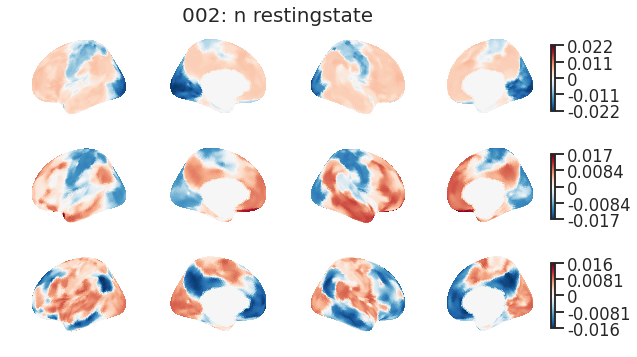

In [18]:
n_embed = 3
for X, subj, (trait, state) in zip(Xs, subjs, labels):
    title = f'{subj}: {trait} {state}'
    fig = visualize_embeddings(
        X[:, :n_embed],
        save_path=False,
        colorbar=True,
        n_embed=n_embed,
        # vmax=vmax,
        title=title,
    )
    plt.show()
    break

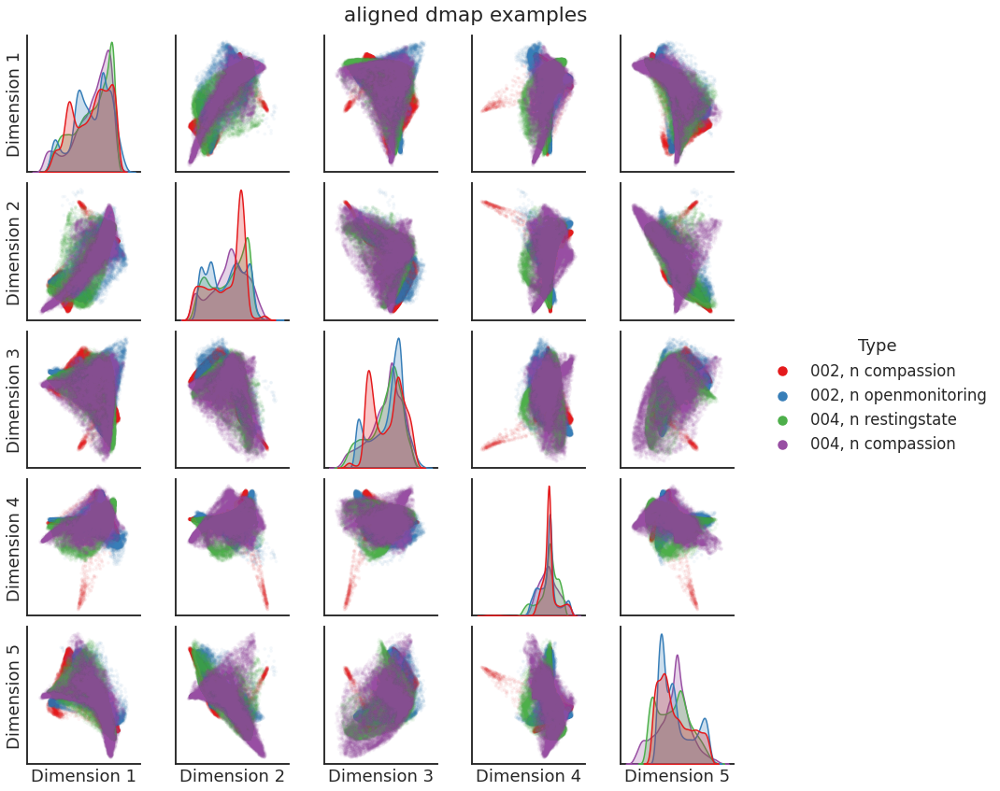

In [19]:
pairplot(
    np.vstack(Xs[1:5]),
    labels=np.hstack([[l]*18715 for l in labels_subj_st[1:5]]),
    alpha=0.05,
    title=f'aligned dmap examples'
)

## Dmap replicated normed, 1/4

In [13]:
source_dir = '/mnt/ssd3/ronan/data/dmap_replication_align-100_normed_01-04'
data = 'dmap'
Xs, labels, subjs = load_data(source_dir, data)
print(np.linalg.norm(Xs[1], axis=0))

sort_idx = np.argsort(subjs)
Xs = Xs[sort_idx]
labels = labels[sort_idx]
subjs = subjs[sort_idx]
labels_st = [l[0] + ' ' + l[1] for l in labels]
labels_subj_st = [f'{subj}, {l}' for subj,l in zip(subjs, labels_st)]

[0.98694944 0.99866205 0.9876975  1.0153465  1.0110003 ]


<Figure size 432x288 with 0 Axes>

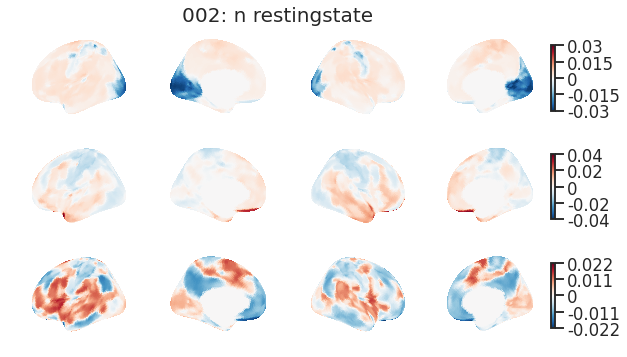

In [14]:
n_embed = 3
for X, subj, (trait, state) in zip(Xs, subjs, labels):
    title = f'{subj}: {trait} {state}'
    fig = visualize_embeddings(
        X[:, :n_embed],
        save_path=False,
        colorbar=True,
        n_embed=n_embed,
        # vmax=vmax,
        title=title,
    )
    plt.show()
    break

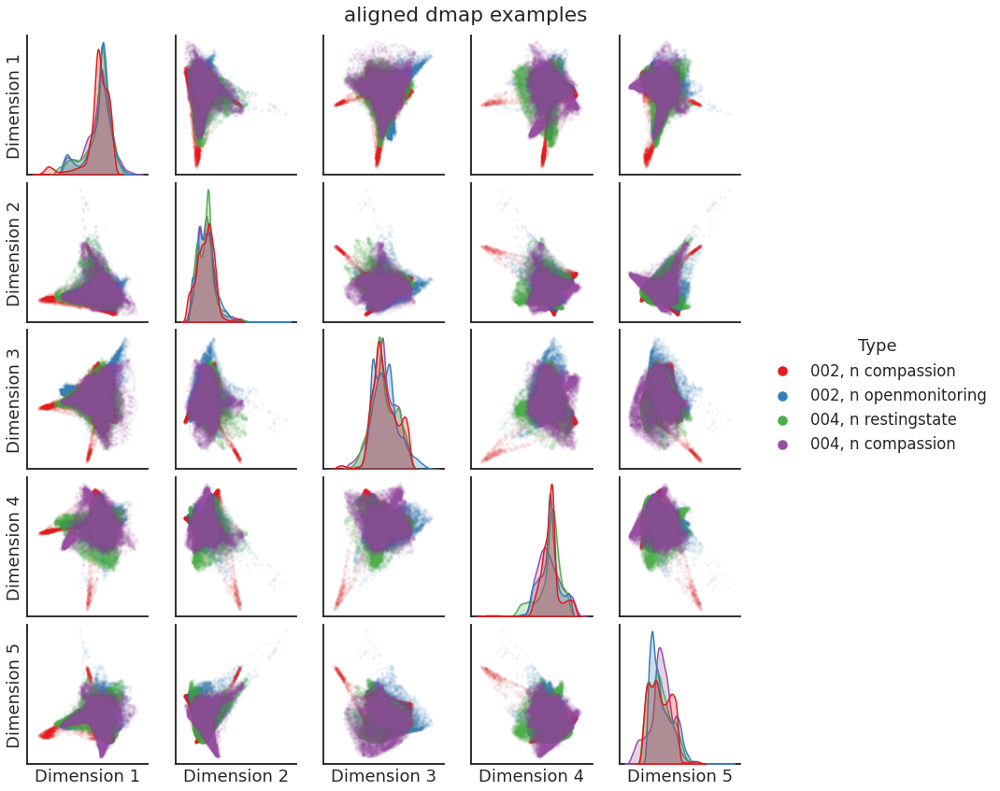

In [15]:
pairplot(
    np.vstack(Xs[1:5]),
    labels=np.hstack([[l]*18715 for l in labels_subj_st[1:5]]),
    alpha=0.05,
    title=f'aligned dmap examples'
)

## Dmap replicated unaligned, 1/4

In [20]:
source_dir = '/mnt/ssd3/ronan/data/dmap_replication_01-04'
data = 'dmap'
Xs, labels, subjs = load_data(source_dir, data)
# Xs /= np.linalg.norm(Xs, axis=1, keepdims=True)
print(np.linalg.norm(Xs[1], axis=0))

sort_idx = np.argsort(subjs)
Xs = Xs[sort_idx]
labels = labels[sort_idx]
subjs = subjs[sort_idx]
labels_st = [l[0] + ' ' + l[1] for l in labels]
labels_subj_st = [f'{subj}, {l}' for subj,l in zip(subjs, labels_st)]

[452.49576  204.13287  170.23267  114.37797  101.924774]


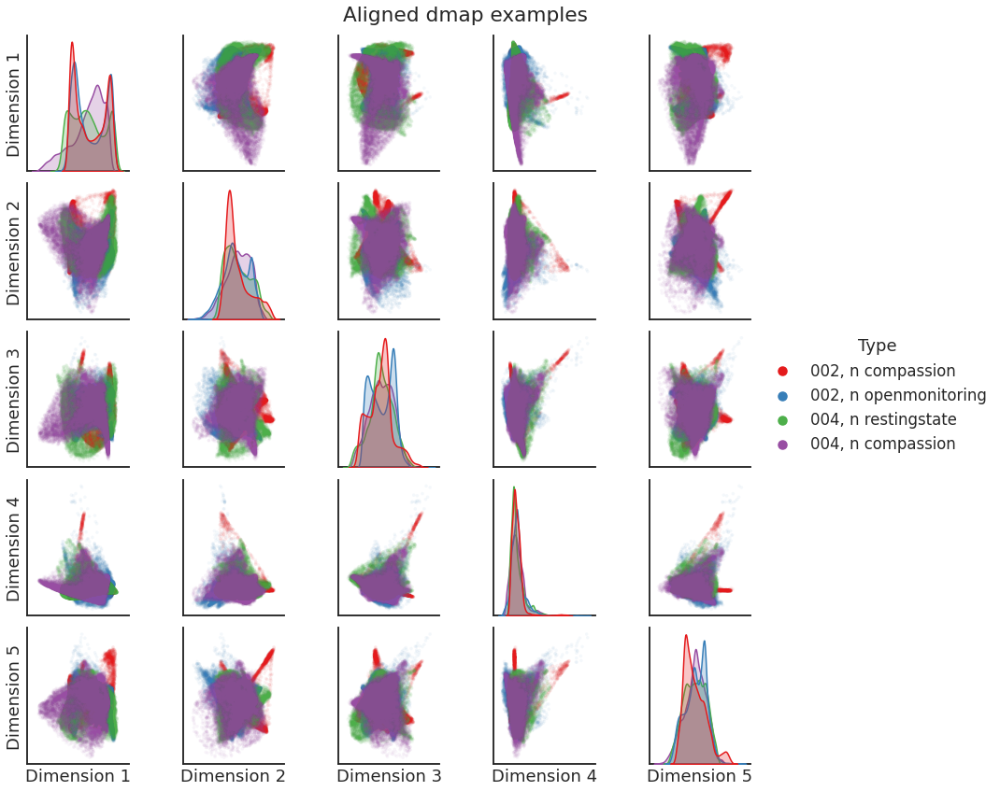

In [42]:
embeddings = Xs
embeddings /= np.linalg.norm(embeddings, axis=1, keepdims=True)

embeddings, _, _ = iterate_align(
    embeddings, labels_st, subjs, thresh=0, max_iter=5, mean_align=False)

# max_iter = 5
# embeddings = align(embeddings[1:], embeddings[0], firstpass=True)

# for i in range(max_iter):
#     mean = np.mean(embeddings, axis=0).squeeze()
#     embeddings = align(
#         embeddings, np.asarray(mean),
#         firstpass=False, debug=True)
# embeddings = np.asarray(embeddings)
pairplot(
    np.vstack(embeddings[1:5]),
    labels=np.hstack([[l]*18715 for l in labels_subj_st[1:5]]),
    alpha=0.05,
    title=f'Aligned dmap examples'
)

## GCCA gradients

In [20]:
source_dir = '/mnt/ssd3/ronan/data/gcca_raw_ZG3-max_12-09'
data = 'gcca'
Xs, labels, subjs = load_data(source_dir, data)
print(np.linalg.norm(Xs[1], axis=0))

sort_idx = np.argsort(subjs)
Xs = Xs[sort_idx]
labels = labels[sort_idx]
subjs = subjs[sort_idx]
labels_st = [l[0] + ' ' + l[1] for l in labels]
labels_subj_st = [f'{subj}, {l}' for subj,l in zip(subjs, labels_st)]

[14.96666836 14.96666592 14.96664439 14.96664282 14.96663695 14.96663857
 14.96677972 14.96671346 14.96680984]


<Figure size 432x288 with 0 Axes>

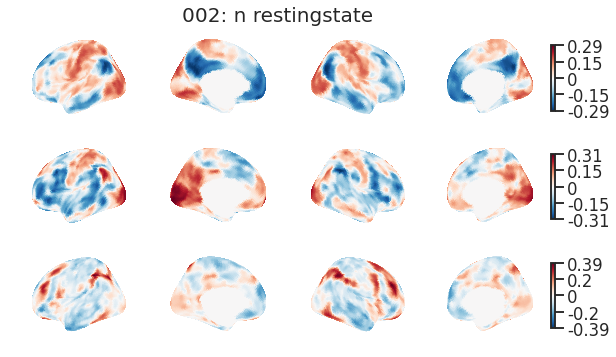

In [21]:
n_embed = 3
for X, subj, (trait, state) in zip(Xs, subjs, labels):
    title = f'{subj}: {trait} {state}'
    fig = visualize_embeddings(
        X[:, :n_embed],
        save_path=False,
        colorbar=True,
        n_embed=n_embed,
        # vmax=vmax,
        title=title,
    )
    plt.show()
    break

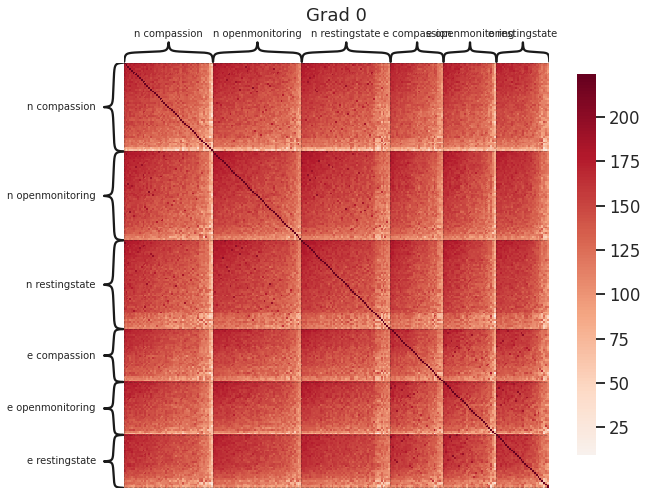

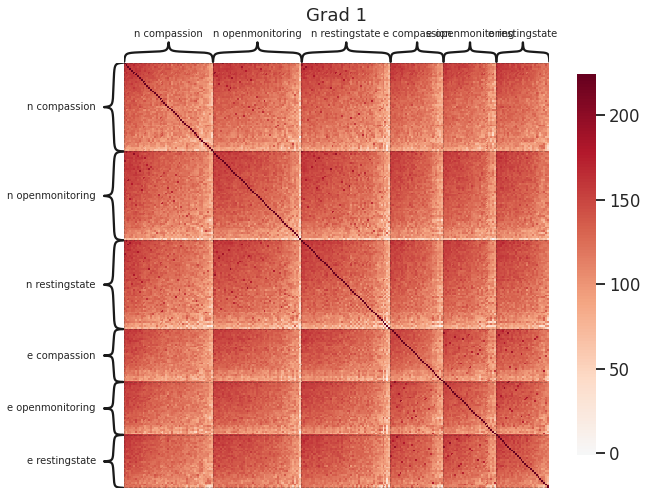

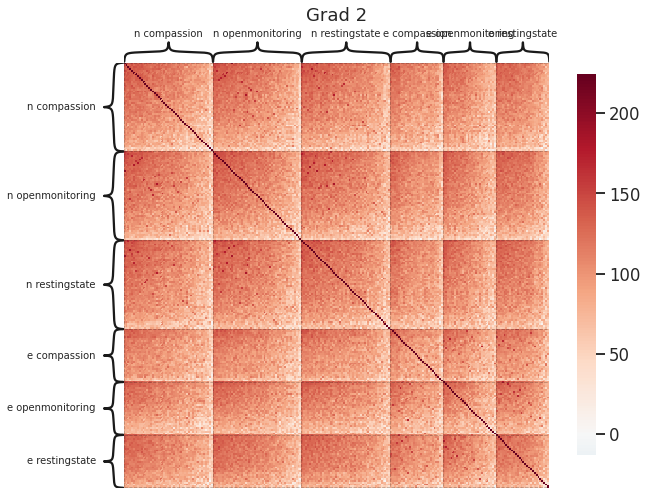

In [153]:
for g in range(3):
    embeddings = Xs[:, :, :5]
    mat = embeddings[:,:,g]
    # mat -= mat.mean(axis=1, keepdims=True)
    # mat /= np.linalg.norm(mat, axis=1, keepdims=True)
    X_dists = pairwise_distances(mat, metric="euclidean")
    X_dists = mat @ mat.T
    fig = heatmap(
        X_dists,
        title=f"Grad {g}",
        transform=None,
        inner_hier_labels=labels_st,
        hier_label_fontsize=10,
    )
    plt.show()

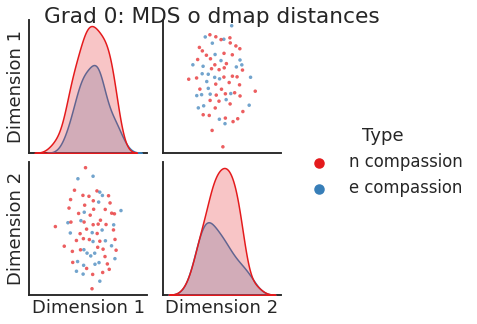

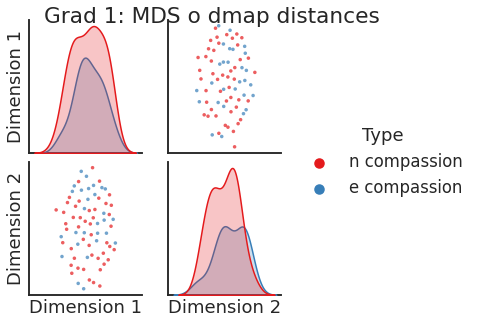

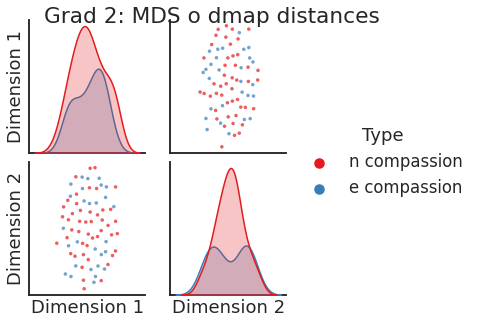

In [55]:
embeddings = Xs[:, :, :5]
n_components = 2
idx = np.where(labels[:,1] == 'compassion')[0]
for g in range(3):
    mat = np.vstack(embeddings[:,:,g])# / np.linalg.norm(np.vstack(embeddings[:,:,g]), axis=1, keepdims=True)
    mds_mat = MDS(n_components=n_components).fit_transform(mat[idx])

    fig = pairplot(mds_mat, labels=np.asarray(labels_st)[idx], title=f"Grad {g}: MDS o dmap distances")
    plt.show()

## MASE o dmap

In [107]:
source_dir = '/mnt/ssd3/ronan/data/mase_dmap_11-16'
data = 'mase_dmap'
Xs, labels, subjs = load_data(source_dir, data)
print(np.linalg.norm(Xs[1], axis=0))

sort_idx = np.argsort(subjs)
Xs = Xs[sort_idx]
labels = labels[sort_idx]
subjs = subjs[sort_idx]
labels_st = [l[0] + ' ' + l[1] for l in labels]
labels_subj_st = [f'{subj}, {l}' for subj,l in zip(subjs, labels_st)]

[1.00445568 0.56667683 0.4709068  0.30616944 0.27776833 0.34158004
 0.19073969 0.26283667]


<Figure size 432x288 with 0 Axes>

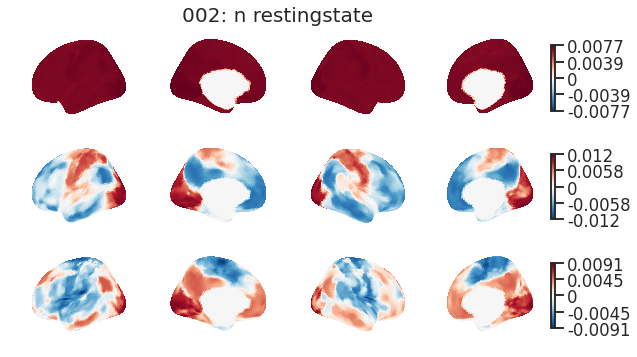

In [108]:
n_embed = 3
for X, subj, (trait, state) in zip(Xs, subjs, labels):
    title = f'{subj}: {trait} {state}'
    fig = visualize_embeddings(
        X[:, :n_embed],
        save_path=False,
        colorbar=True,
        n_embed=n_embed,
        # vmax=vmax,
        title=title,
    )
    plt.show()
    break

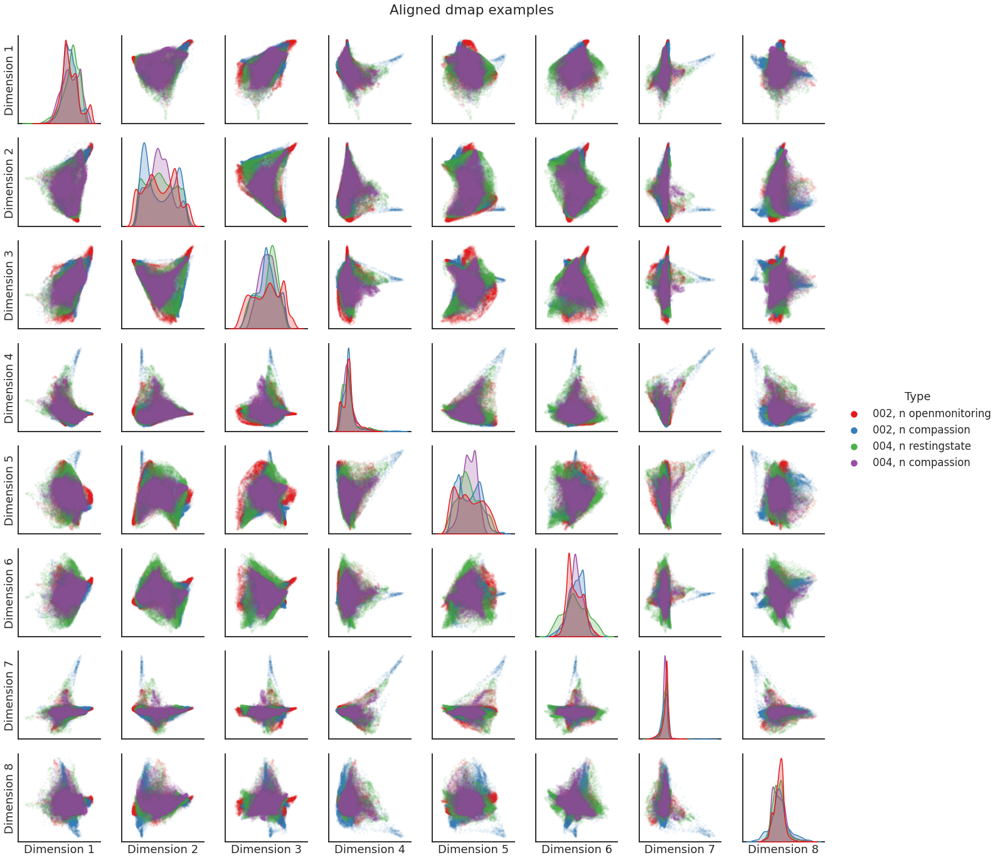

In [109]:
pairplot(
    np.vstack(Xs[1:5]),
    labels=np.hstack([[l]*18715 for l in labels_subj_st[1:5]]),
    alpha=0.05,
    title=f'Aligned dmap examples'
)

## Dmap svd alignment

In [39]:
source_dir = '/mnt/ssd3/ronan/data/dmap_antoinne_09-04'
data = 'antoine'
Xs, labels, subjs = load_data(source_dir, data)
print(np.linalg.norm(Xs[1], axis=0))

sort_idx = np.argsort(subjs)[::-1]
Xs = Xs[sort_idx]
labels = labels[sort_idx]
subjs = subjs[sort_idx]
labels_st = [l[0] + ' ' + l[1] for l in labels]
labels_subj_st = [f'{subj}, {l}' for subj,l in zip(subjs, labels_st)]

[252.59346  246.74161  168.04521  123.80227   92.611305]


In [30]:
from scipy.sparse.linalg import svds
from sklearn.preprocessing import normalize

def multistep_align(Xs: np.ndarray) -> np.ndarray:
    # Create a concatenated view of Us
    Sall = np.linalg.norm(Xs, axis=1)
    Uall = Xs / np.linalg.norm(Xs, axis=1, keepdims=True)
    Uall_c = np.concatenate(Uall, axis=1)

    d = Sall.shape[1]
    UU, SS, VV = svds(Uall_c, d*5)
    sort_idx = np.argsort(SS)[::-1]
    SS = SS[sort_idx]
    UU = UU[:, sort_idx]
    group_U = UU[:,:d]
    VV = VV.T[:, sort_idx]
    VV = VV[:, :d]
    s
    # SVDS the concatenated Us
    idx_end = 0
    projection_mats = []
    n = len(Xs)
    for i in range(n):
        idx_start = idx_end
        idx_end = idx_start + d
        VVi = normalize(VV[idx_start:idx_end, :], "l2", axis=0)

        # Compute the canonical projections
        A = np.linalg.solve(np.diag(Sall[i]), VVi)
        projection_mats.append(A)
        
    return SS, np.asarray([X @ pmat for X, pmat in zip(Xs, projection_mats)])

    # return SS, np.asarray([group_U @ (group_U.T @ U) for U in Uall])

In [41]:
np.mean(Xs_align, axis=1)

array([[-3.8041550e-04,  2.1518780e-04, -3.6267764e-05,  2.1159906e-04,
         1.5353788e-06],
       [ 3.7647830e-04,  2.1434775e-04, -4.9161376e-05,  2.1261963e-04,
         4.5258898e-06],
       [-3.7981049e-04,  2.2041050e-04, -8.8011166e-06, -2.0912087e-04,
         5.3460985e-06],
       ...,
       [ 2.3684932e-04, -1.4516288e-04, -1.0604423e-04,  2.4725223e-04,
         3.5913014e-05],
       [-2.4031477e-04,  1.3597403e-04,  9.5057476e-05, -2.4698584e-04,
         2.7245109e-05],
       [-2.4025945e-04,  1.4696963e-04, -1.0100175e-04, -2.4654469e-04,
        -3.5524816e-05]], dtype=float32)

In [31]:
evals, Xs_align = multistep_align(Xs)

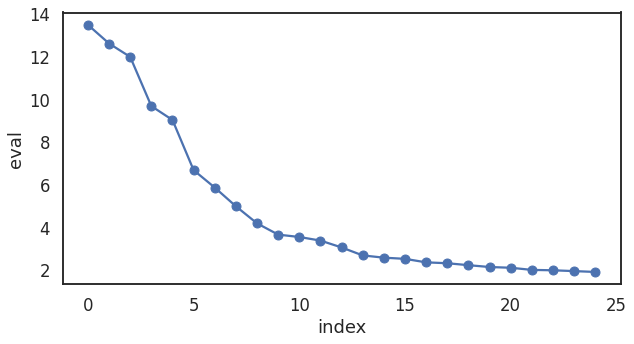

In [37]:
f, ax = plt.subplots(1, 1, figsize=(10,5))
ax.plot(np.arange(len(evals)), evals, marker='o')
plt.xlabel('index')
plt.ylabel('eval')
plt.show()

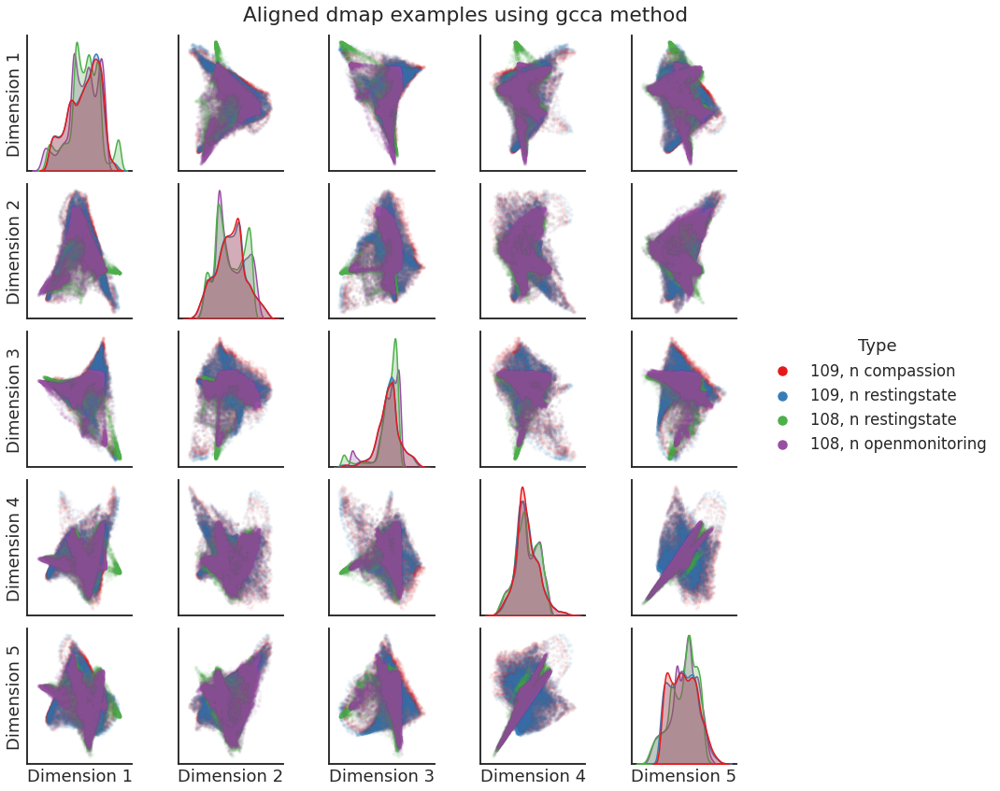

In [38]:
pairplot(
    np.vstack(Xs[1:5]),
    labels=np.hstack([[l]*18715 for l in labels_subj_st[1:5]]),
    alpha=0.05,
    title=f'Aligned dmap examples using gcca method'
)

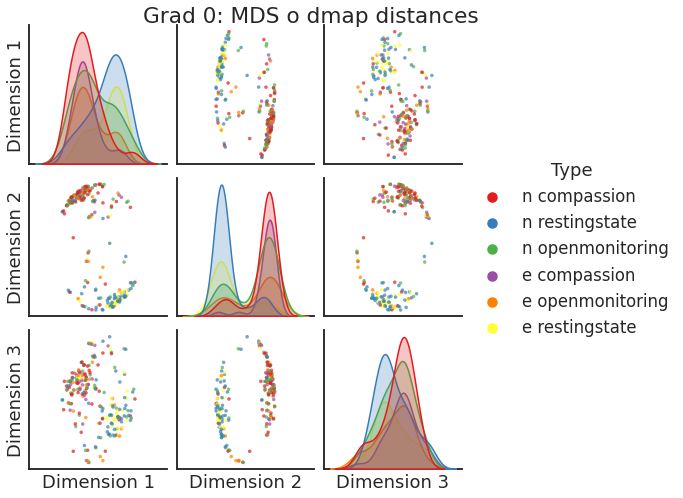

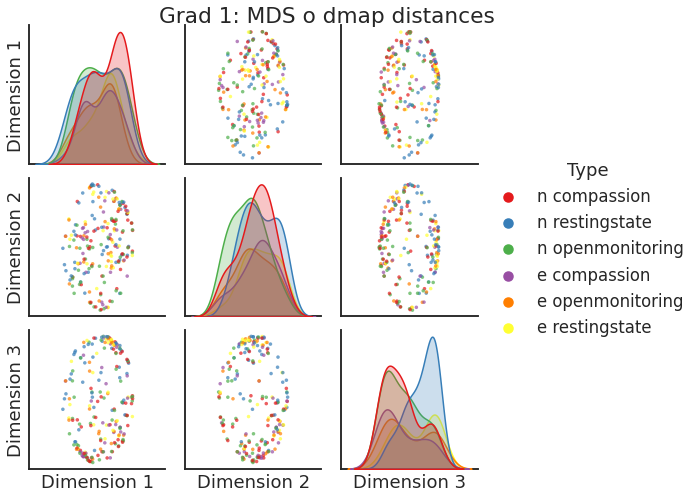

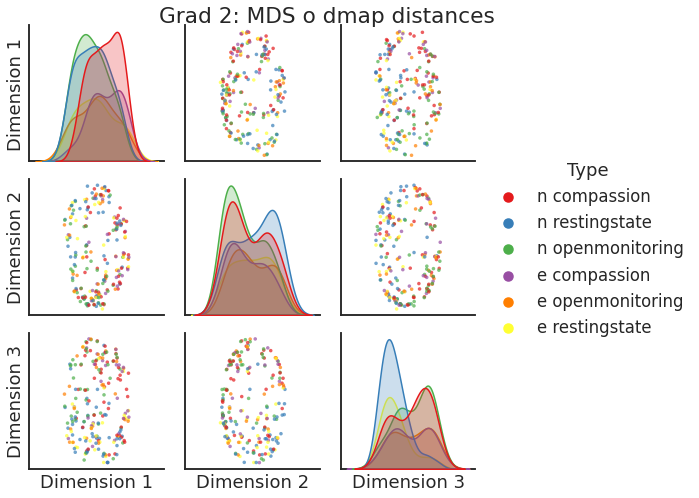

In [34]:
embeddings = Xs_align[:, :, :5]
n_components = 3
idx = np.arange(225)#np.where(labels[:,1] == 'openmonitoring')[0]
for g in range(3):
    mat = embeddings[:,:,g]
    # mat -= mat.mean(axis=1, keepdims=True)
    mat /= np.linalg.norm(mat, axis=1, keepdims=True)
    mds_mat = MDS(n_components=n_components).fit_transform(mat[idx])

    fig = pairplot(mds_mat, labels=np.asarray(labels_st)[idx], title=f"Grad {g}: MDS o dmap distances")
    plt.show()

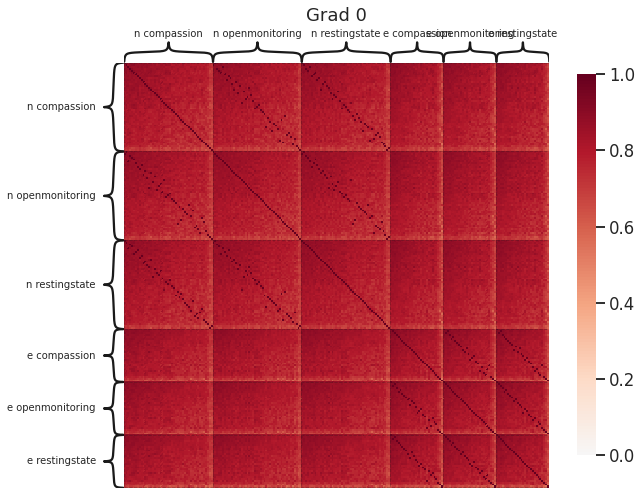

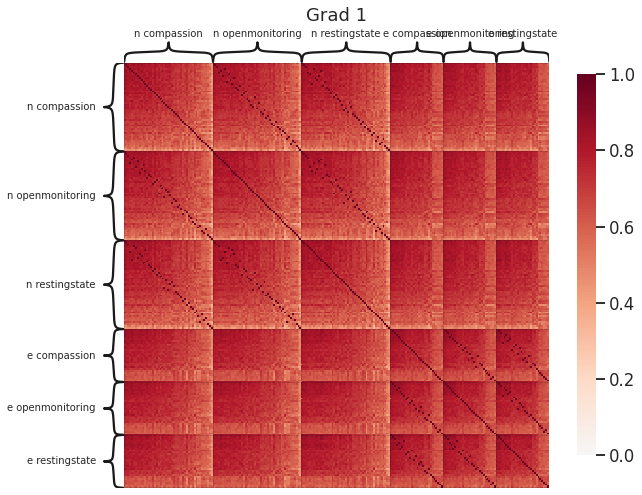

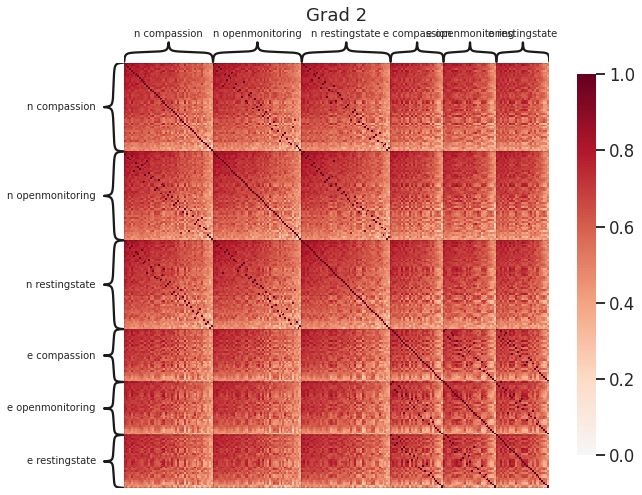

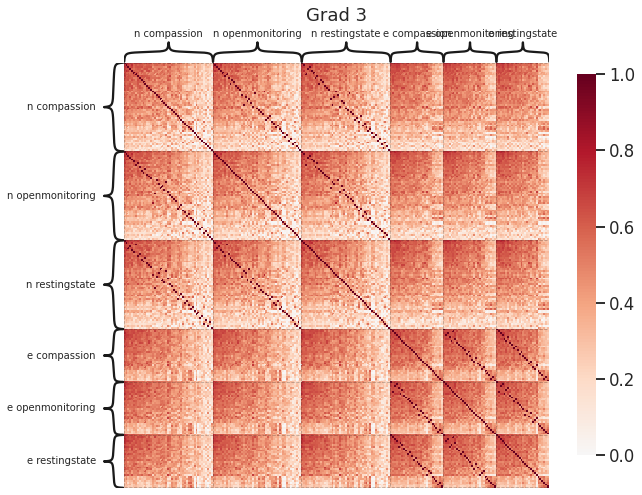

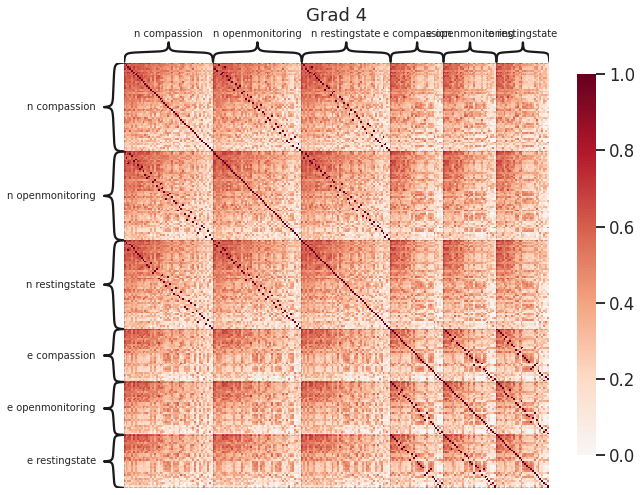

In [252]:
for g in range(3):
    embeddings = Xs_align[:, :, :5]
    mat = embeddings[:,:,g]
    # mat -= mat.mean(axis=1, keepdims=True)
    mat /= np.linalg.norm(mat, axis=1, keepdims=True)
    # X_dists = pairwise_distances(mat, metric="euclidean")
    X_dists = mat @ mat.T
    fig = heatmap(
        X_dists,
        title=f"Grad {g}",
        transform=None,
        inner_hier_labels=labels_st,
        hier_label_fontsize=10,
        vmax=1,
        vmin=0
    )
    plt.show()

## Antoine dmap
pairwise vs group distances

In [7]:
source_dir = '/mnt/ssd3/ronan/data/dmap_antoinne_09-04'
data = 'antoine'
Xs, labels, subjs = load_data(source_dir, data)
print(np.linalg.norm(Xs[1], axis=0))

sort_idx = np.argsort(subjs)[::-1]
Xs = Xs[sort_idx]
labels = labels[sort_idx]
subjs = subjs[sort_idx]
labels_st = [l[0] + ' ' + l[1] for l in labels]
labels_subj_st = [f'{subj}, {l}' for subj,l in zip(subjs, labels_st)]

[252.59346  246.74161  168.04521  123.80227   92.611305]


In [24]:
n = len(Xs)
pair_dists = np.asarray([np.zeros((n, n)) for _ in range(Xs.shape[2])])
for i in range(n):
    for j in range(n):
        if i <= j:
            continue
        x, y = procrustes(Xs[i], Xs[j])
        ds = np.linalg.norm(x-y, axis=0)
        pair_dists[:, i, j] = ds
        pair_dists[:, j, i] = ds

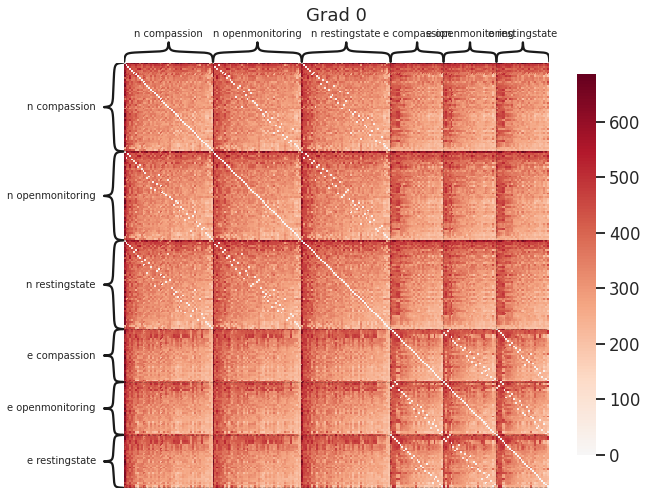

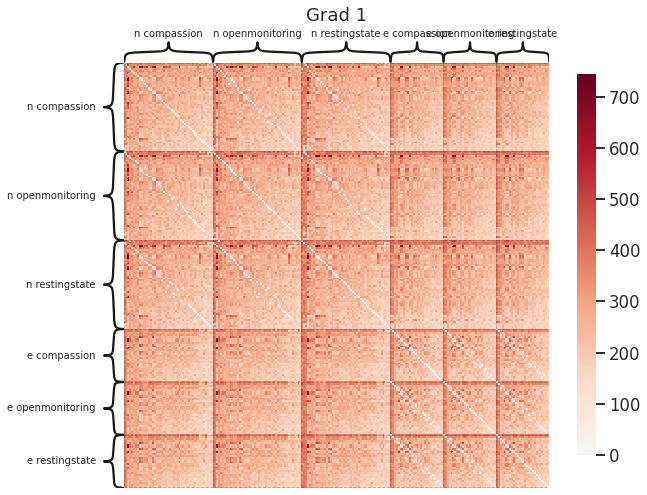

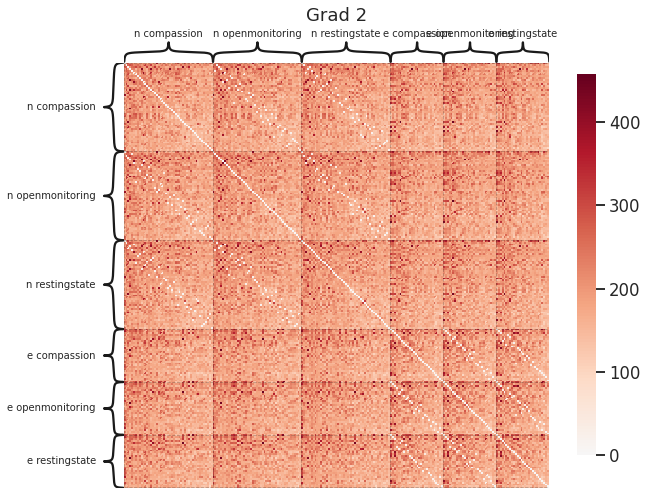

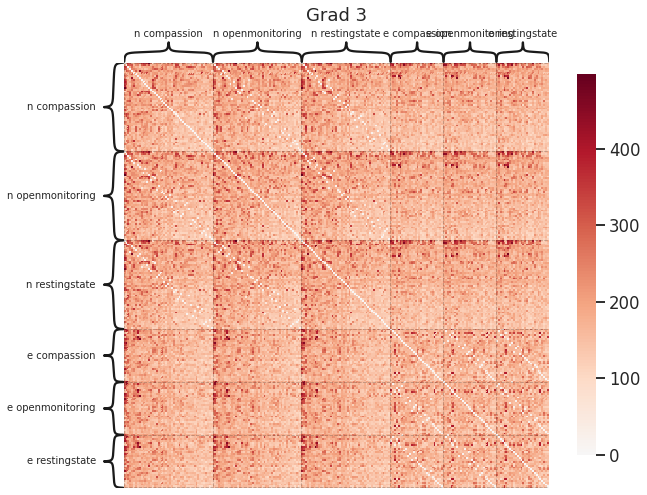

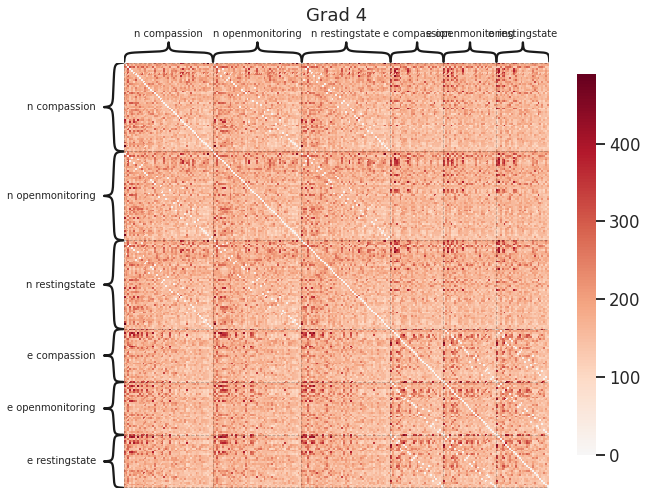

In [16]:
for g in range(5):
    X_dists = pair_dists[g, :, :]
    # mat -= mat.mean(axis=1, keepdims=True)
    # mat /= np.linalg.norm(mat, axis=1, keepdims=True)
    # X_dists = pairwise_distances(mat, metric="euclidean")
    # X_dists = mat @ mat.T
    fig = heatmap(
        X_dists,
        title=f"Grad {g}",
        transform=None,
        inner_hier_labels=labels_st,
        hier_label_fontsize=10,
    )
    plt.show()

In [32]:
embeddings, _, _ = iterate_align(Xs, labels, subjs, max_iter=5, thresh=0, mean_align=True)
n = len(Xs)
group_dists = np.asarray([np.zeros((n, n)) for _ in range(Xs.shape[2])])
for i in range(n):
    for j in range(n):
        if i <= j:
            continue
        ds = np.linalg.norm(embeddings[i] - embeddings[j], axis=0)
        group_dists[:, i, j] = ds
        group_dists[:, j, i] = ds

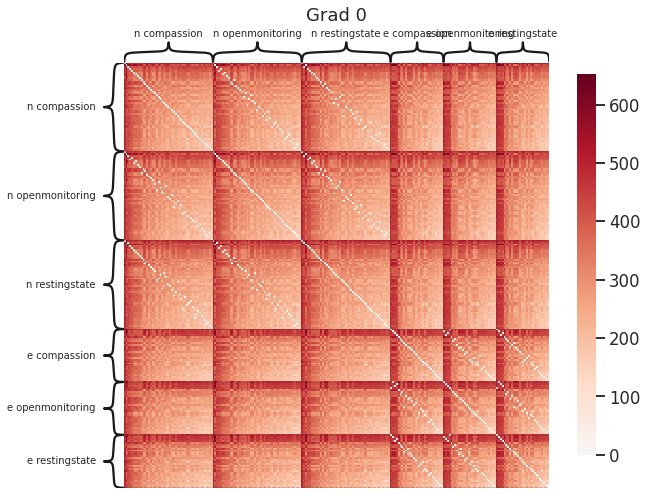

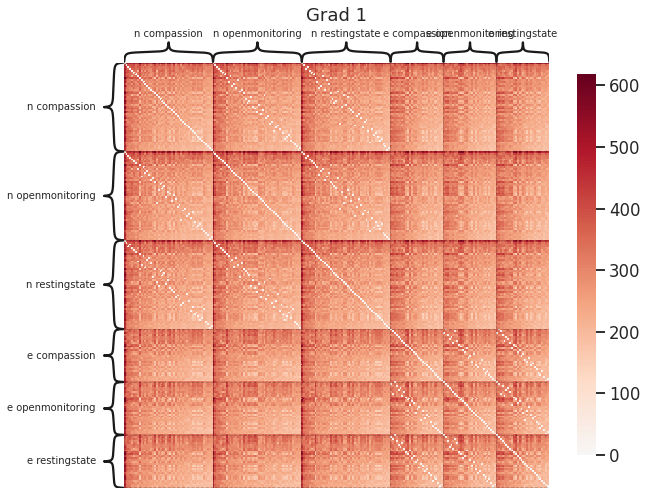

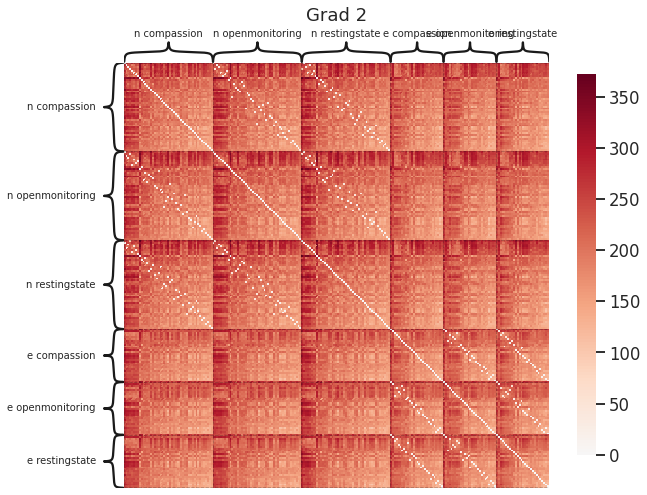

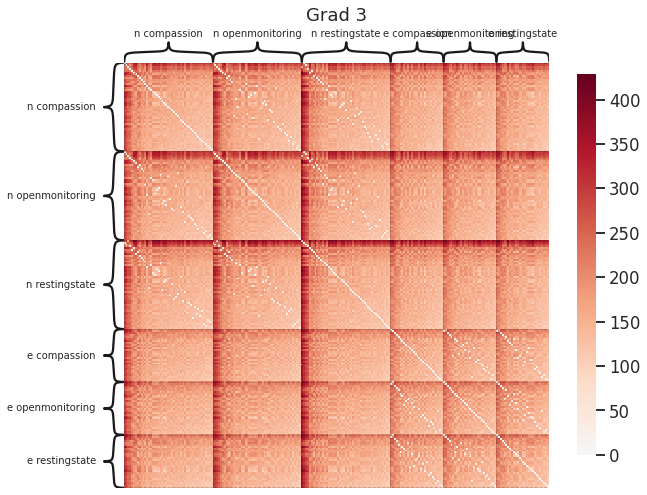

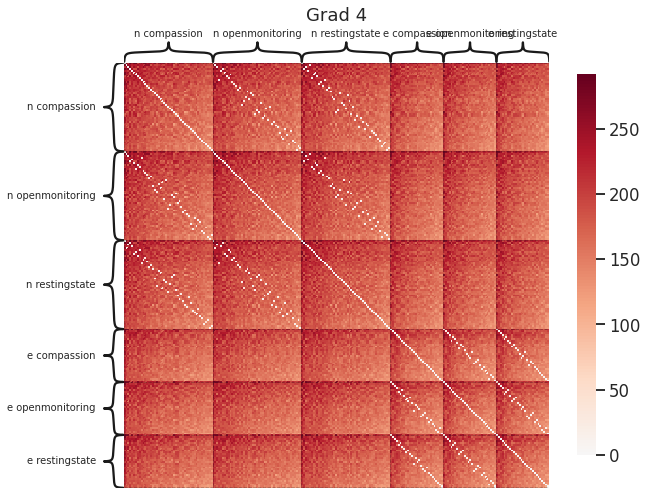

In [33]:
for g in range(5):
    X_dists = group_dists[g,:,:]
    # mat -= mat.mean(axis=1, keepdims=True)
    # mat /= np.linalg.norm(mat, axis=1, keepdims=True)
    # X_dists = pairwise_distances(mat, metric="euclidean")
    # X_dists = mat @ mat.T
    fig = heatmap(
        X_dists,
        title=f"Grad {g}",
        transform=None,
        inner_hier_labels=labels_st,
        hier_label_fontsize=10,
    )
    plt.show()

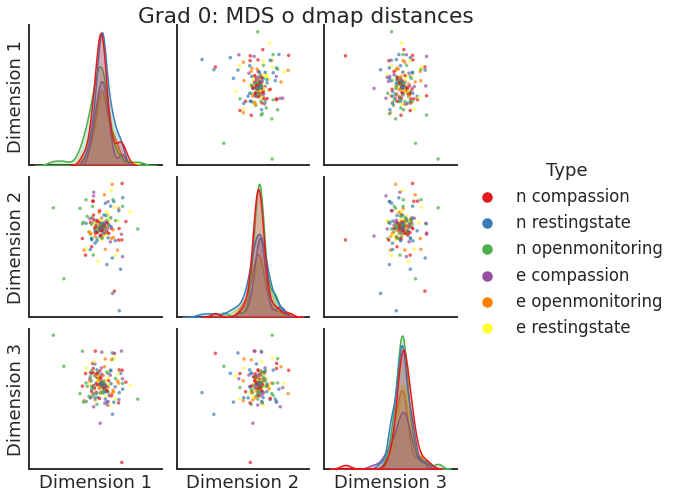

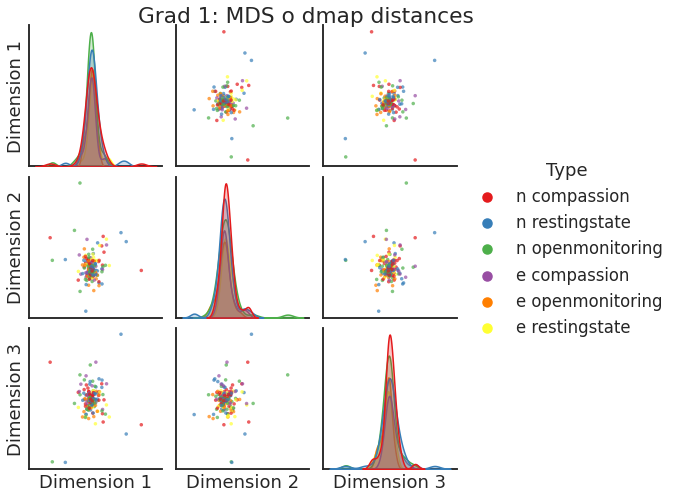

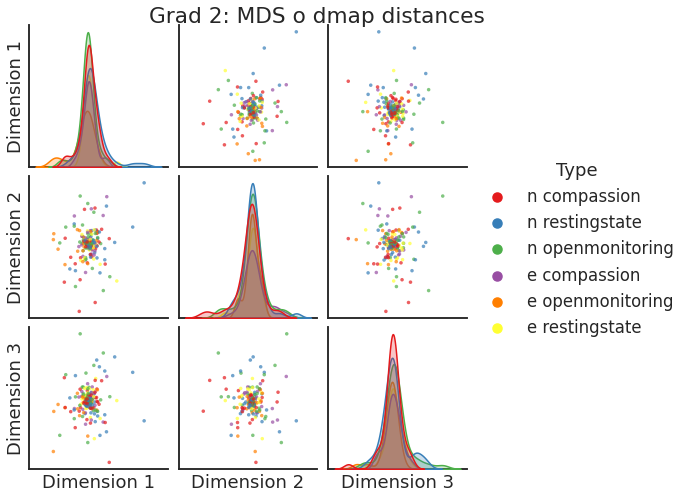

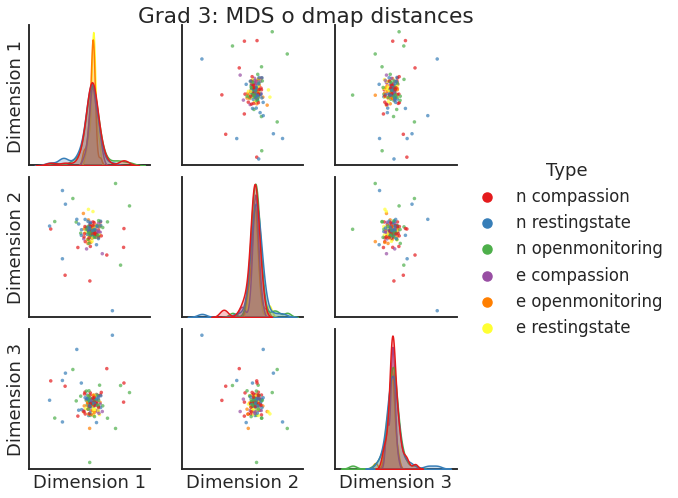

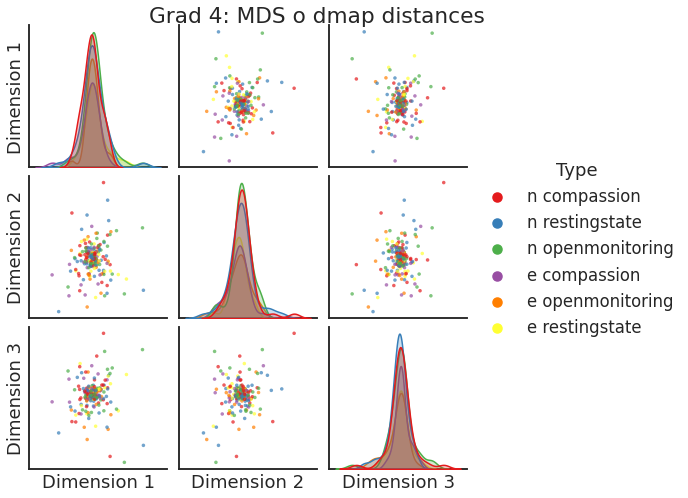

In [34]:
n_components = 3
for g in range(5):
    mat = pair_dists[g, :, :] - group_dists[g,:,:] 
    # mat -= mat.mean(axis=1, keepdims=True)
    # mat /= np.linalg.norm(mat, axis=1, keepdims=True)
    mds_mat = MDS(n_components=n_components, dissimilarity='precomputed').fit_transform(mat)

    fig = pairplot(mds_mat, labels=np.asarray(labels_st)[idx], title=f"Grad {g}: MDS o dmap distances")
    plt.show()

In [38]:
source_dir = '/mnt/ssd3/ronan/data/joint_mapalign_12-30'
data = 'joint'
Xs, labels, subjs = load_data(source_dir, data)
print(np.linalg.norm(Xs[1], axis=0))

sort_idx = np.argsort(subjs)[::-1]
Xs = Xs[sort_idx]
labels = labels[sort_idx]
subjs = subjs[sort_idx]
labels_st = [l[0] + ' ' + l[1] for l in labels]
labels_subj_st = [f'{subj}, {l}' for subj,l in zip(subjs, labels_st)]

[255.50807745 198.44135713 110.68833113 129.53057062  97.18816357]


In [ ]:
pairplot(
    np.vstack(Xs),
    labels=np.hstack([[l]*18715 for l in labels_subj_st]),
    alpha=0.05,
    title=f'Aligned dmap examples'
)

In [40]:
labels_subj_st

['093, n openmonitoring', '029, n restingstate']